## 機械学習ことはじめ

データを読み込んで確認する。

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline

In [2]:
uselog = pd.read_csv('data/use_log.csv')
uselog.isnull().sum()

log_id         0
customer_id    0
usedate        0
dtype: int64

In [3]:
customer = pd.read_csv('data/customer_join.csv')
customer.isnull().sum()

customer_id             0
name                    0
class                   0
gender                  0
start_date              0
end_date             2842
campaign_id             0
is_deleted              0
class_name              0
price                   0
campaign_name           0
mean                    0
median                  0
max                     0
min                     0
routine_flg             0
calc_date               0
membership_period       0
dtype: int64

月別利用回数の、平均/中央/最大/最小 と利用期間(月)

In [4]:
customer_clustering = customer[['mean', 'median', 'max', 'min', 'membership_period']]
customer_clustering.head()

,mean,median,max,min,membership_period
0,4.833333,5.0,8,2,47
1,5.083333,5.0,7,3,47
2,4.583333,5.0,6,3,47
3,4.833333,4.5,7,2,47
4,3.916667,4.0,6,1,47


しれっとクラスタリング…って事は、月の利用傾向と利用期間でグループ分類するってことかな？

In [5]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
customer_clustering_sc = sc.fit_transform(customer_clustering)

kmeans = KMeans(n_clusters=4, random_state=0)
clusters = kmeans.fit(customer_clustering_sc)
customer_clustering['cluster'] = clusters.labels_

print(customer_clustering['cluster'].unique())
customer_clustering.head()

[3 1 0 2]


,mean,median,max,min,membership_period,cluster
0,4.833333,5.0,8,2,47,3
1,5.083333,5.0,7,3,47,3
2,4.583333,5.0,6,3,47,3
3,4.833333,4.5,7,2,47,3
4,3.916667,4.0,6,1,47,3


KMean ってことは

1. K 個の分類があるという前提でグラフ上に K 個の点を配置
2. 最も近いほかのデータとの平均を計算
3. この K 個の点を平均の位置に移動

これを繰り返してグループを判定する。  
そんなアルゴリズムなのだけど、K の値は決め打ちになるのですよね…

その意味でこの 4 という数字が妥当なのだろうか？  
ちょっとグラフにプロット + 分類の色付けを行ってみる。

実行には **スカッター行列** を採用して、判定されたグループごとに色分けを行う。

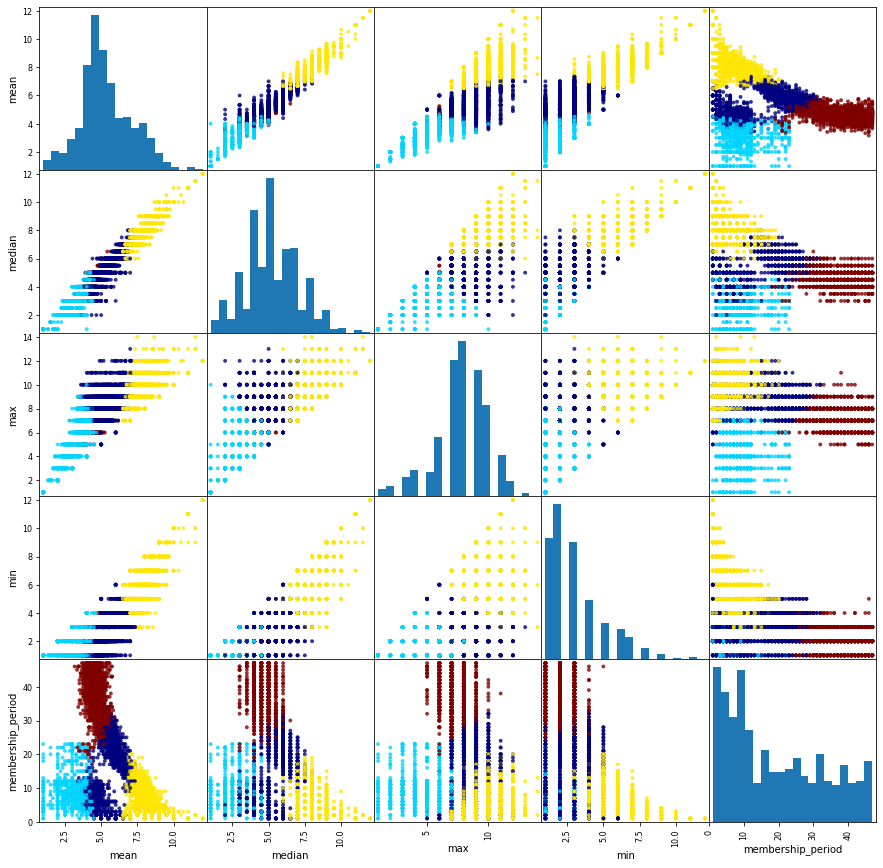

In [6]:
grr = pd.plotting.scatter_matrix(
    customer_clustering[['mean', 'median', 'max', 'min', 'membership_period']], # プロット対象
    c=customer_clustering['cluster'],  # 分類
    figsize=(15,15),  # 図のサイズ
    marker='.',  # マーカー
    hist_kwds={'bins': 20}, # hist関数に渡される（ヒストグラムのbins（棒の数）を指定）
    s=60,  # scaterに渡る引数で、マーカのサイズ。
    alpha=0.8,  # 図上オブジェクトの透明度
    cmap=plt.get_cmap('jet')   # カラーマップ see: https://matplotlib.org/3.3.1/tutorials/colors/colormaps.html
)

ああなるほど、利用期間が絡んでくると、利用期間の多い人間と少ない人間でバラけてくれるのか…。  
正直 k-mean の k 値判定は、色付きグラフ化しながら増減設定していく以外の手段が実質ない…。

分析に移っていくとしませう

In [7]:
# 教科書どおりに項目名変えるか…ってこのあたり日本人向けなんね
customer_clustering.columns = ['月内平均', '月内中央値', '月内最大値', '月内最小値', '会員期間', 'cluster']
customer_clustering.groupby('cluster').count()

,月内平均,月内中央値,月内最大値,月内最小値,会員期間
cluster,,,,,
0,1334,1334,1334,1334,1334
1,763,763,763,763,763
2,846,846,846,846,846
3,1249,1249,1249,1249,1249


教科書に比べるとグループ番号が違ったりとかちょっとだけ値が違ったりするけど、それが正常。  
というのは、k-mean アルゴリズムだと、k 点の初期位置がランダムで、それにより最終的なグループ位置にばらつきが出るため。

グループごとの各値の平均と標準偏差を取る

In [8]:
customer_clustering.groupby('cluster').mean()

,月内平均,月内中央値,月内最大値,月内最小値,会員期間
cluster,,,,,
0,5.524239,5.375187,8.745877,2.687406,14.843328
1,3.054713,2.888598,4.756225,1.653997,9.263434
2,8.054608,8.039598,10.009456,6.160757,7.072104
3,4.677494,4.671337,7.232986,2.153723,36.915933


In [9]:
customer_clustering.groupby('cluster').std()

,月内平均,月内中央値,月内最大値,月内最小値,会員期間
cluster,,,,,
0,0.798374,1.053864,1.133561,1.149268,8.650775
1,0.876713,0.927157,1.959785,0.787580,4.924102
2,0.915702,0.998178,1.209393,1.582499,4.640011
3,0.478513,0.618449,0.916900,0.780617,6.376927


割と見たまま。

会員期間はグラフ見たときにわかると思うけど、値の振れ幅が大きい。  
しかし、1,2 グループで会員期間が短いのが見て取れる。  
図に照らすと、

* グループ0 : 青色
* グループ1 : 水色
* グループ2 : 黄色
* グループ3 : 茶色(高頻度利用グループ)

クラスタリング結果を可視化…ってもうやってる気が（汗

まぁやってみようか

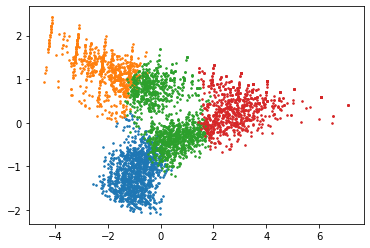

In [10]:
from sklearn.decomposition import PCA
X = customer_clustering_sc

pca = PCA(n_components=2)
pca.fit(X)
x_pca = pca.transform(X)
pca_df = pd.DataFrame(x_pca)
pca_df['cluster'] = customer_clustering['cluster']

for i in customer_clustering['cluster'].unique():
    tmp = pca_df.loc[pca_df['cluster'] == i]
    plt.scatter(tmp[0], tmp[1], marker='.', s=10)

plt.show()

PCA ってなんじゃらほ？って思って調べてみたら、[主成分分析](https://qiita.com/g-k/items/893e4e836ae493b03c47) のことらしい。  
超ざっくり言うと、情報の劣化を最小にしたまま、データの次元数を減らすと考えれば良さそう。

だから平面グラフ 1 個で表現できる…となるほどなー。

退会顧客の傾向を把握する…と

In [11]:
customer_clustering = pd.concat([customer_clustering, customer], axis=1)  # 軸を指定する事で列方向の結合
customer_clustering.groupby(['cluster', 'is_deleted'], as_index=False).count()[['cluster', 'is_deleted', 'customer_id']]

,cluster,is_deleted,customer_id
0,0,0,785
1,0,1,549
2,1,1,763
3,2,0,827
4,2,1,19
5,3,0,1230
6,3,1,19


グループ 2,3 は継続顧客が多い。  
グループ 1 は全滅、グループ 0 は半々で退会している。

グループ 2 の会員機関は平均「7.072104」なので、利用期間が浅いからまだ残ってる…。  
逆にグループ 1 の会員期間「9.263434」ヶ月位で辞める人は一気に止めてしまう。  
その後グループ 0 の期間を経由（このへんで振るいに落とされて）、安定した顧客のグループ 3 に至ると。

In [12]:
customer_clustering.groupby(['cluster', 'routine_flg'], as_index=False).count()[['cluster', 'routine_flg', 'customer_id']]

,cluster,routine_flg,customer_id
0,0,0,228
1,0,1,1106
2,1,0,497
3,1,1,266
4,2,0,52
5,2,1,794
6,3,0,2
7,3,1,1247


定期利用フラグを見ると

グループ 0 : 定期利用は明確に多い。  
グループ 1 : は定期利用していない人のほうが優勢。  
グループ 2 : 結構な人が定期利用中。  
グループ 3 : ほぼ定期利用している。

翌月の利用回数予測を行うために準備を始める。

In [13]:
uselog['usedate'] = pd.to_datetime(uselog['usedate'])
uselog['年月'] = uselog['usedate'].dt.strftime('%Y%m')
uselog_months = uselog.groupby(['年月', 'customer_id'], as_index=False).count()
uselog_months.rename(columns={'log_id':'count'}, inplace=True)
del uselog_months['usedate']
uselog_months.head()

,年月,customer_id,count
0,201804,AS002855,4
1,201804,AS009013,2
2,201804,AS009373,3
3,201804,AS015315,6
4,201804,AS015739,7


In [14]:
year_months = list(uselog_months['年月'].unique())
predict_data = pd.DataFrame()

print(year_months)

for i in range(6, len(year_months)):
    tmp = uselog_months.loc[uselog_months['年月'] == year_months[i]]
    tmp.rename(columns={'count':'count_pred'}, inplace=True)
    for j in range(1, 7):
        tmp_before = uselog_months.loc[uselog_months['年月'] == year_months[i - j]]
        del tmp_before['年月']
        tmp_before.rename(columns={'count':'count_{}'.format(j-1)}, inplace=True)
        tmp = pd.merge(tmp, tmp_before, on='customer_id', how='left')
    predict_data = pd.concat([predict_data, tmp], ignore_index=True)
predict_data.head()
    

['201804', '201805', '201806', '201807', '201808', '201809', '201810', '201811', '201812', '201901', '201902', '201903']


,年月,customer_id,count_pred,count_0,count_1,count_2,count_3,count_4,count_5
0,201810,AS002855,3,7.0,3.0,5.0,5.0,5.0,4.0
1,201810,AS008805,2,2.0,5.0,7.0,8.0,NaN,NaN
2,201810,AS009373,5,6.0,6.0,7.0,4.0,4.0,3.0
3,201810,AS015233,7,9.0,11.0,5.0,7.0,7.0,NaN
4,201810,AS015315,4,7.0,3.0,6.0,3.0,3.0,6.0


In [15]:
predict_data['年月'].unique()

array(['201810', '201811', '201812', '201901', '201902', '201903'],
      dtype=object)

In [16]:
predict_data.loc[(predict_data['customer_id'] == 'AS002855')]

,年月,customer_id,count_pred,count_0,count_1,count_2,count_3,count_4,count_5
0,201810,AS002855,3,7.0,3.0,5.0,5.0,5.0,4.0
3070,201811,AS002855,5,3.0,7.0,3.0,5.0,5.0,5.0
6115,201812,AS002855,2,5.0,3.0,7.0,3.0,5.0,5.0
9228,201901,AS002855,6,2.0,5.0,3.0,7.0,3.0,5.0
12320,201902,AS002855,5,6.0,2.0,5.0,3.0,7.0,3.0
15357,201903,AS002855,4,5.0,6.0,2.0,5.0,3.0,7.0


In [17]:
predict_data.loc[(predict_data['customer_id'] == 'AS008805')]

,年月,customer_id,count_pred,count_0,count_1,count_2,count_3,count_4,count_5
1,201810,AS008805,2,2.0,5.0,7.0,8.0,NaN,NaN
3071,201811,AS008805,3,2.0,2.0,5.0,7.0,8.0,NaN
6116,201812,AS008805,5,3.0,2.0,2.0,5.0,7.0,8.0
9229,201901,AS008805,1,5.0,3.0,2.0,2.0,5.0,7.0
12321,201902,AS008805,6,1.0,5.0,3.0,2.0,2.0,5.0
15358,201903,AS008805,1,6.0,1.0,5.0,3.0,2.0,2.0


NaN を含む(= そこで退会した)人を削除する？  
あれこれ論理が逆じゃね？だって → に行くほど時間が遡るハズ…ってことは、`1	201810	AS008805	2	2.0	5.0	7.0	8.0	NaN	NaN` の行は 201806 から利用を開始したってことになるはず。  
教科書の嘘かな？これは推理を確認してみる

In [18]:
uselog_months.loc[(uselog_months['customer_id'] == 'AS008805')]['年月'].head()

6055     201806
9159     201807
12292    201808
15425    201809
18533    201810
Name: 年月, dtype: object

In [19]:
customer.loc[(customer['customer_id'] == 'AS008805')]['start_date']

3265    2018-06-07
Name: start_date, dtype: object

やっぱり…と思って調べたら、案の定正誤表に乗ってた。  
第二版がないからかは不明だが、未修正のまま Kindle に乗ってるらしい（ヲイ



In [20]:
predict_data = predict_data.dropna()
predict_data = predict_data.reset_index(drop = True)
predict_data.head()

,年月,customer_id,count_pred,count_0,count_1,count_2,count_3,count_4,count_5
0,201810,AS002855,3,7.0,3.0,5.0,5.0,5.0,4.0
1,201810,AS009373,5,6.0,6.0,7.0,4.0,4.0,3.0
2,201810,AS015315,4,7.0,3.0,6.0,3.0,3.0,6.0
3,201810,AS015739,5,6.0,5.0,8.0,6.0,5.0,7.0
4,201810,AS019860,7,5.0,7.0,4.0,6.0,8.0,6.0


特徴量を付与する

In [21]:
predict_data = pd.merge(predict_data, customer[['customer_id', 'start_date']], on='customer_id', how='left')
predict_data.head()

,年月,customer_id,count_pred,count_0,count_1,count_2,count_3,count_4,count_5,start_date
0,201810,AS002855,3,7.0,3.0,5.0,5.0,5.0,4.0,2016-11-01
1,201810,AS009373,5,6.0,6.0,7.0,4.0,4.0,3.0,2015-11-01
2,201810,AS015315,4,7.0,3.0,6.0,3.0,3.0,6.0,2015-07-01
3,201810,AS015739,5,6.0,5.0,8.0,6.0,5.0,7.0,2017-06-01
4,201810,AS019860,7,5.0,7.0,4.0,6.0,8.0,6.0,2017-10-01


In [22]:
predict_data['now_date'] = pd.to_datetime(predict_data['年月'], format='%Y%m')
predict_data['start_date'] = pd.to_datetime(predict_data['start_date'])

from dateutil.relativedelta import relativedelta

predict_data['period'] = None
for i in range(len(predict_data)):
    delta = relativedelta(predict_data['now_date'][i], predict_data['start_date'][i])
    predict_data['period'][i] = delta.years*12 + delta.months
predict_data.head()

,年月,customer_id,count_pred,count_0,count_1,count_2,count_3,count_4,count_5,start_date,now_date,period
0,201810,AS002855,3,7.0,3.0,5.0,5.0,5.0,4.0,2016-11-01,2018-10-01,23
1,201810,AS009373,5,6.0,6.0,7.0,4.0,4.0,3.0,2015-11-01,2018-10-01,35
2,201810,AS015315,4,7.0,3.0,6.0,3.0,3.0,6.0,2015-07-01,2018-10-01,39
3,201810,AS015739,5,6.0,5.0,8.0,6.0,5.0,7.0,2017-06-01,2018-10-01,16
4,201810,AS019860,7,5.0,7.0,4.0,6.0,8.0,6.0,2017-10-01,2018-10-01,12


来月の利用回数予測を行ってみる。  
てか、この予測モデルには季節というファクターが抜けてる気がするんだが…

まぁいいや

In [23]:
predict_data = predict_data.loc[(predict_data['start_date'] >= pd.to_datetime('20180401'))]

from sklearn import linear_model
import sklearn.model_selection

model = linear_model.LinearRegression()  # 線形回帰モデル
X = predict_data[['count_0', 'count_1', 'count_2', 'count_3', 'count_4', 'count_5', 'period']]
y = predict_data['count_pred']

# おなじみ 学習データX と回答データY を引数にして、X_学習用, X_検証用, Y_学習用回答データ, Y_検証用データ に分離する。
# デフォルトは 30% が検証用になった気がする
X_train, X_test, Y_train, Y_test = sklearn.model_selection.train_test_split(X, y)

model.fit(X_train, Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [24]:
print(model.score(X_train, Y_train))
print(model.score(X_test, Y_test))

0.5994484572916156
0.6287949418841161


うーわー（汗  
学習データですら検証してみると 6 割。検証用データでやってみても正解率 5 割。

二値判定って訳でもないのだけど、ちょっと精度がクソすぎるでしょう（汗

モデルに寄与している変数を確認してみます。

In [25]:
coef = pd.DataFrame({ 'feature_names':X.columns, 'coefficient':model.coef_ })
coef

,feature_names,coefficient
0,count_0,0.309306
1,count_1,0.220848
2,count_2,0.164857
3,count_3,0.169560
4,count_4,0.075640
5,count_5,0.070241
6,period,0.079916


古いデータほど役にたってないというのが目に見えてわかりますね…。

来月の利用回数の予測

In [26]:
x1 = [3, 4, 4, 6, 8, 7, 8]
x2 = [2, 2, 3, 3, 4, 6, 8]
x_period = [x1, x2]

In [27]:
model.predict(x_period)

array([3.86224149, 2.0648995 ])

とまぁやっってみるとそれぞれ 3.8 回、 2回 利用されると予測されました